# UTILS

## DASK SESSION

In [2]:
from dask.distributed import Client, progress
client = Client(memory_limit='12GB')
client

/home/basile_earthobservation/anaconda3/envs/covid/lib/python3.9/site-packages/distributed/node.py:151: UserWarning: Port 8787 is already in use.
Perhaps you already have a cluster running?
Hosting the HTTP server on port 40443 instead
  warnings.warn(


Client Scheduler: tcp://127.0.0.1:42689 Dashboard: http://127.0.0.1:40443/status,Cluster Workers: 4 Cores: 8 Memory: 48.00 GB


## PACKAGES

In [144]:
import xarray
import rioxarray
import geopandas as gpd
import dask.dataframe as dd

import datetime
import numpy as np
import pandas as pd
import plotly.express as px
import plotly.graph_objects as go
from shapely.geometry.polygon import Polygon
import plotly.express as px

## DATA

In [4]:
# !curl https://static.data.gouv.fr/resources/donnees-hospitalieres-relatives-a-lepidemie-de-covid-19/20210104-190649/donnees-hospitalieres-covid19-2021-01-04-19h03.csv --output covid19.csv

In [6]:
#!wget https://download-0008.copernicus-climate.eu/cache-compute-0008/cache/data5/adaptor.mars.internal-1609790914.7741523-10074-8-3e8c7a98-3832-46d5-961b-00ea5c662488.nc

# OPENING THE DATA

### France admin

In [157]:
france = gpd.read_file('departements-version-simplifiee.geojson')
france.head()

,code,nom,geometry
0,01,Ain,"POLYGON ((4.78021 46.17668, 4.79458 46.21832, ..."
1,02,Aisne,"POLYGON ((4.04797 49.40564, 4.03991 49.39740, ..."
2,03,Allier,"POLYGON ((3.03207 46.79491, 3.04907 46.75808, ..."
3,04,Alpes-de-Haute-Provence,"POLYGON ((5.67604 44.19143, 5.69209 44.18648, ..."
4,05,Hautes-Alpes,"POLYGON ((6.26057 45.12685, 6.29922 45.10855, ..."


### Covid19 data

In [158]:
covid = dd.read_csv('covid19.csv',
                    sep   = ';',
                    dtype = {
                        'dep'  : str,
                        'sexe' : int,
                        'hosp' : int,
                        'rea'  : int,
                        'rad'  : int,
                        'dc'   : int
                    },
                    parse_dates= ['jour'])

covid['dc'] = covid['dc'].diff(periods=3)

covid.head()

,dep,sexe,jour,hosp,rea,rad,dc
0,01,0,2020-03-18,2,0,1,NaN
1,01,1,2020-03-18,1,0,1,NaN
2,01,2,2020-03-18,1,0,0,NaN
3,02,0,2020-03-18,41,10,18,11.0
4,02,1,2020-03-18,19,4,11,6.0


### ERA5 data

In [160]:
dst = xarray.open_mfdataset('../adaptor.mars.internal-1609790914.7741523-10074-8-3e8c7a98-3832-46d5-961b-00ea5c662488.nc').rio.write_crs(4326)

dst_dayly  = dst[['u10','v10','t2m']].resample(time = 'D').mean()
rain_dayly = dst['tp'].resample(time = 'D').sum()

In [13]:
d_dst_dayly      = dict()
d_rain_dayly     = dict()


for index in france.index:
    
    geometry = [france.iloc[index]['geometry'].__geo_interface__]
    name = france.iloc[index]['code']
    
    try :
        d_dst_dayly[name]         = dst_dayly.rio.clip(geometries=geometry, crs=4326).mean('latitude').mean('longitude').to_dataframe().drop(['spatial_ref'], axis = 1).reset_index()
        d_dst_dayly[name]['dep']  = name
    
        d_rain_dayly[name]        = rain_dayly.rio.clip(geometries=geometry, crs=4326).mean('latitude').mean('longitude').to_dataframe().drop(['spatial_ref'], axis = 1).reset_index()
        d_rain_dayly[name]['dep'] = name
        
    except :
        print(name)

75


In [75]:
df_dst  = pd.concat([d_dst_dayly[key] for key in d_dst_dayly.keys()]).reset_index().drop(['index'], axis =1)
df_rain = pd.concat([d_rain_dayly[key] for key in d_rain_dayly.keys()]).reset_index().drop(['index'], axis =1).drop(['time', 'dep'], axis = 1)
df_dst  = df_dst.join(df_rain)

df_dst.to_csv('df_dst.csv')

df_dst.head()

,time,u10,v10,t2m,dep,tp
0,2020-03-01,0.974748,3.110744,280.077057,01,0.063716
1,2020-03-02,0.568130,0.757587,277.452393,01,0.291293
2,2020-03-03,0.947154,-0.337001,276.453033,01,0.056209
3,2020-03-04,0.322600,0.740365,276.798645,01,0.002581
4,2020-03-05,0.730984,3.445092,279.849823,01,0.364009


In [41]:
fig = px.line(df_dst, x="time", y="t2m", color='dep', title = 'rainfall per departement in france')
fig.show()

In [77]:
df_dst

,time,u10,v10,t2m,dep,tp
0,2020-03-01,0.974748,3.110744,280.077057,01,0.063716
1,2020-03-02,0.568130,0.757587,277.452393,01,0.291293
2,2020-03-03,0.947154,-0.337001,276.453033,01,0.056209
3,2020-03-04,0.322600,0.740365,276.798645,01,0.002581
4,2020-03-05,0.730984,3.445092,279.849823,01,0.364009
...,...,...,...,...,...,...
23270,2020-10-27,2.278925,4.051184,283.570892,95,0.043889
23271,2020-10-28,4.221609,3.723945,284.671661,95,0.028072
23272,2020-10-29,3.671320,2.744816,285.452454,95,0.011061
23273,2020-10-30,2.768193,2.770717,287.119415,95,0.004212


In [78]:
df_Pays_de_Loire = df_dst.loc[df_dst['dep']=='44'].copy()
df_Pays_de_Loire['t2m'] = df_Pays_de_Loire['t2m'].apply(lambda x : x-273.15)

fig = go.Figure()
fig.add_trace(go.Scatter(x=df_Pays_de_Loire.time, y=df_Pays_de_Loire.t2m, name = 'temparture in Celsius'))
fig.add_trace(go.Scatter(x=df_Pays_de_Loire.time, y=df_Pays_de_Loire.u10, name = 'norm of eastward wind'))
fig.add_trace(go.Scatter(x=df_Pays_de_Loire.time, y=df_Pays_de_Loire.v10, name = 'norm of northward wind'))
fig.add_trace(go.Scatter(x=df_Pays_de_Loire.time, y=df_Pays_de_Loire.tp, name = 'average of the total precipitation'))



fig.update_layout(title='Our 4 climatic variables for the departement Pays de La Loire',
                   xaxis_title='Month',
                   yaxis_title='Celsius | mm of precipitation | m/s ')
fig.show()

In [80]:
fig = px.line(df_dst, x="time", y="t2m", color='dep', title = 'temperature per departement in france')
fig.show()

In [81]:
fig = px.line(df_dst, x="time", y="u10", color='dep', title = 'u10 per departement in france')
fig.show()

In [82]:
fig = px.line(df_dst, x="time", y="v10", color='dep', title = 'v10 per departement in france')
fig.show()

### Action du gouvernement

In [103]:
# COMMERCES OUVERTS   = 0
# COMMERCES FERMES    = 1
# COUVRE FEU          = 2
# CONFINEMENT 100km   = 3
# CONFINEMENT TOTAL   = 4


etape_0 =  pd.DataFrame({'date' : pd.date_range("2020-01-01", periods=77, freq="D")})
etape_0['etat'] = 'PAS DE CONFINEMENT & COMMERCES OUVERTS' #0

etape_1 = pd.DataFrame({'date' : pd.date_range("2020-03-17", periods=56, freq="D")})
etape_1['etat'] = 'CONFINEMENT TOTAL' #4

etape_2 = pd.DataFrame({'date' : pd.date_range("2020-05-11", periods=18, freq="D")})
etape_2['etat'] = 'CONFINEMENT 100km' #3

etape_3 = pd.DataFrame({'date' : pd.date_range("2020-05-28", periods=26, freq="D")})
etape_3['etat'] = 'PAS DE CONFINEMENT & COMMERCES FERMES' #1

etape_4 = pd.DataFrame({'date' : pd.date_range("2020-06-22", periods=131, freq="D")})
etape_4['etat'] = 'PAS DE CONFINEMENT & COMMERCES OUVERTS' #0

etape_5 = pd.DataFrame({'date' : pd.date_range("2020-10-30", periods=47, freq="D")})
etape_5['etat'] = 'CONFINEMENT TOTAL' #4

etape_6 = pd.DataFrame({'date' : pd.date_range("2020-12-15", periods=50, freq="D")})
etape_6['etat'] = 'COUVRE FEU' #2

action_gouv = pd.concat([etape_0, etape_1,etape_2,etape_3,etape_4,etape_5,etape_6]).set_index('date')

fig = px.line(action_gouv, y="etat", title = 'Action of the gouvernement')
fig.show()

#  JOINING THE DATA

In [182]:
date = '2019-01-01'
departement = dict()
for i in france.code: 
    if i != '75':
        t2m_dep   = df_t2m.loc[df_t2m['dep'] == i].set_index('time').drop(['dep'], axis =1)
        rain_dep  = df_rainfall[df_rainfall['dep'] == i].set_index('time').drop(['dep'], axis =1)
        u10_dep   = df_u10[df_u10['dep'] == i].set_index('time').drop(['dep'], axis =1)
        v10_dep   = df_v10[df_v10['dep'] == i].set_index('time').drop(['dep'], axis =1)
        covid_dep = covid.loc[covid.dep == i].set_index('jour')
        covid_dep = covid_dep.loc[covid_dep.sexe != 0]
        covid_dep['dc'] = covid_dep['dc'].diff(periods=2)
        covid_dep['dc'] = covid_dep['dc'].apply(lambda x : 0 if x<0 else x,  meta=('int'))
        covid_dep['rea'] = covid_dep['rea'].rolling(window=3).mean()
        covid_dep['hosp'] = covid_dep['hosp'].rolling(window=3).mean()
        full           = u10_dep.join(v10_dep)
        departement[i] = covid_dep.join(t2m_dep.join(rain_dep.join(full)))
        departement[i] = departement[i].join(action_gouv)
        departement[i] = departement[i].dropna().compute()
    else :
        pass

In [190]:
df_full  = pd.concat([departement[key] for key in departement.keys()]).reset_index()
df_full['time'] = df_full['index']
df_full = df_full.drop(['index'], axis = 1)
df_full.to_csv('df_full.csv')
df_full

,dep,sexe,hosp,rea,rad,dc,t2m,tp,u10,v10,etat,time
0,01,1,1.000000,0.000000,1,0.0,284.948181,0.006653,-0.211989,0.715435,4.0,2020-03-20
1,01,2,1.000000,0.000000,0,0.0,284.948181,0.006653,-0.211989,0.715435,4.0,2020-03-20
2,01,1,1.000000,0.000000,1,0.0,283.602905,0.003800,-0.352148,-0.681619,4.0,2020-03-21
3,01,2,1.666667,0.000000,0,0.0,283.602905,0.003800,-0.352148,-0.681619,4.0,2020-03-21
4,01,1,2.666667,0.333333,1,0.0,282.162659,0.004886,-0.422062,-1.376936,4.0,2020-03-22
...,...,...,...,...,...,...,...,...,...,...,...,...
43123,95,2,215.333333,18.000000,1598,0.0,285.452454,0.011061,3.671320,2.744816,0.0,2020-10-29
43124,95,1,218.333333,28.333333,2050,0.0,287.119415,0.004212,2.768193,2.770717,4.0,2020-10-30
43125,95,2,222.666667,19.000000,1611,0.0,287.119415,0.004212,2.768193,2.770717,4.0,2020-10-30
43126,95,1,226.333333,29.000000,2057,0.0,286.105042,0.017505,0.902014,3.072099,4.0,2020-10-31


In [145]:
df_full = pd.read_csv('df_full.csv', parse_dates=['time']).drop(['Unnamed: 0'], axis = 1)
df_full

,dep,sexe,hosp,rea,rad,dc,t2m,tp,u10,v10,etat,time
0,01,1,1.000000,0.000000,1,0.0,284.94818,0.006653,-0.211989,0.715435,4.0,2020-03-20
1,01,2,1.000000,0.000000,0,0.0,284.94818,0.006653,-0.211989,0.715435,4.0,2020-03-20
2,01,1,1.000000,0.000000,1,0.0,283.60290,0.003800,-0.352148,-0.681619,4.0,2020-03-21
3,01,2,1.666667,0.000000,0,0.0,283.60290,0.003800,-0.352148,-0.681619,4.0,2020-03-21
4,01,1,2.666667,0.333333,1,0.0,282.16266,0.004886,-0.422062,-1.376936,4.0,2020-03-22
...,...,...,...,...,...,...,...,...,...,...,...,...
43123,95,2,215.333333,18.000000,1598,0.0,285.45245,0.011061,3.671320,2.744816,0.0,2020-10-29
43124,95,1,218.333333,28.333333,2050,0.0,287.11942,0.004212,2.768193,2.770717,4.0,2020-10-30
43125,95,2,222.666667,19.000000,1611,0.0,287.11942,0.004212,2.768193,2.770717,4.0,2020-10-30
43126,95,1,226.333333,29.000000,2057,0.0,286.10504,0.017505,0.902014,3.072099,4.0,2020-10-31


### CHECKING THE CORRELATION

In [146]:
fig = px.imshow(df_full.corr())
fig.show()

## MAPPING

In [152]:
dict_geo = dict()
for dep in france.code:
    dict_geo[dep] = df_full.loc[df_full['dep'] == dep].corr()['hosp']['t2m']
df_corr = pd.DataFrame({'correlation_temperature_hospitalisation' : dict_geo.values(), 'dep' : dict_geo.keys()}).set_index('dep')
df_corr

,correlation_temperature_hospitalisation
dep,
01,-0.351870
02,-0.328965
03,-0.430294
04,-0.570808
05,-0.592656
...,...
91,-0.282524
92,-0.251277
93,-0.230620


<AxesSubplot:>

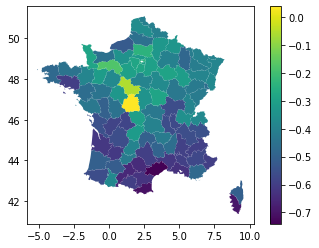

In [153]:
geo = france.set_index('code').join(df_corr)
geo.plot('correlation_temperature_hospitalisation',  legend=True)